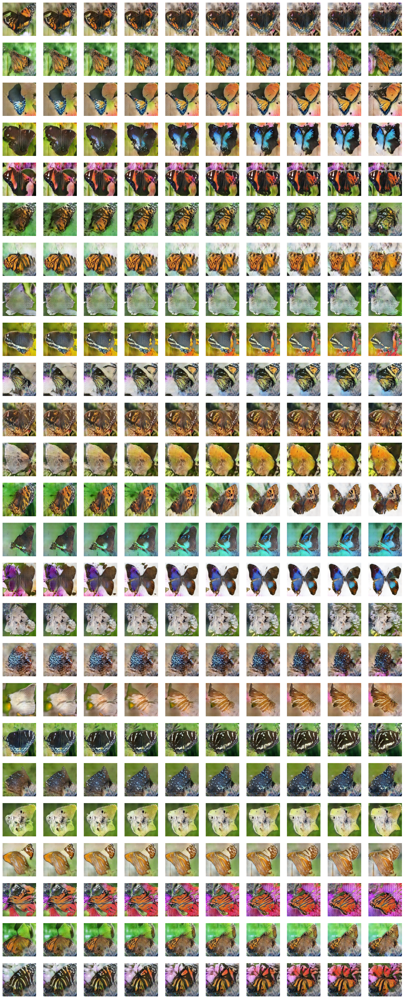

In [128]:

fixed_distance = 10 
steps = 10 

all_interpolated_images = []

for z in random_points:
    # Generate a point at a fixed distance from z
    random_direction = torch.randn_like(z).to(device)
    random_direction = fixed_distance * random_direction / random_direction.norm()  # Normalize

    # Interpolate between z and z + random_direction
    interpolated = interpolate_vectors(z, z + random_direction, steps=steps)
    
    # Pass the interpolated vectors through the generator
    with torch.no_grad():
        interpolated_images = netG(interpolated)
        
    interpolated_images = [(img - img.min()) / (img.max() - img.min()) for img in interpolated_images]

    all_interpolated_images.append(interpolated_images)

fig, axs = plt.subplots(25, 10, figsize=(20, 50))

axs = axs.flatten()

for i in range(len(all_interpolated_images)):
    for j in range(len(all_interpolated_images[i])):
        img = all_interpolated_images[i][j].cpu().numpy().transpose(1, 2, 0)  # Convert to (H, W, C)
        axs[i * len(all_interpolated_images[i]) + j].imshow(img)
        axs[i * len(all_interpolated_images[i]) + j].axis('off')  

plt.show()